# Creating a project for analysis of Volve data

### Author: M.Ravasi

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os 
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import lasio

import matplotlib.pyplot as plt
import scipy.interpolate as spint

from scipy.stats import norm
from scipy.signal import filtfilt 
from scipy.interpolate import RegularGridInterpolator
from scipy.ndimage import gaussian_filter
from sklearn.linear_model import LinearRegression 

from pysubsurface.utils.wavelets import ricker
from pysubsurface.objects import Project, Intervals, Picks, Well, Trajectory, Logs, TDcurve, \
    Surface, Interpretation, Seismic
from pysubsurface.objects.Seismic import Seismic
from pysubsurface.objects.utils import _findclosest_point, _findclosest_well_seismicsections
from pysubsurface.objects.Seismic import _extract_arbitrary_path
from pysubsurface.proc.geomod.geomod import create_geomodel 

from pysubsurface.utils.utils import change_name_for_unix, findclosest
from pysubsurface.visual.cmap import *
from pysubsurface.visual.combinedviews import seismic_through_wells

In [2]:
# checkshots
checkshots = {'NO 15/9-19 A':'NO_15_9-19A_TIME-CKS',
              'NO 15/9-19 BT2':'NO_15_9-19BT2_TIME-CKS'}
checkshotwelllist = list(checkshots.keys())

# horizons
horizonset = 'official_streamer'
horizonset_depth_files = ('Ty_Fm_Top+ST10010ZC11_270613_updateF11wells_EasyDC+STAT+DEPTH.dat',
                          'SHETLAND_GP_Top+ST10010ZC11_160913_unadj_EasyDC+STAT+DEPTH.dat',
                          'BCU+ST10010ZC11_NoF10_160913_adjVolve_EasyDC+STAT+DEPTH.dat',
                          'Hugin_Fm_Top+ST10010ZC11_Near_190314_adj2_2760_EasyDC+STAT+DEPTH.dat',
                          'Hugin_Fm_Base+ST10010ZC11_Near_190314_adj_2999_EasyDC+STAT+DEPTH.dat')
horizonset_depth_names = ('Ty_Fm_Top+ST10010ZC11_270613_updateF11wells_EasyDC+STAHJT+DEPTH',
                          'SHETLAND_GP_Top+ST10010ZC11_160913_unadj_EasyDC+STAT+DEPTH',
                          'BCU+ST10010ZC11_NoF10_160913_adjVolve_EasyDC+STAT+DEPTH',
                          'Hugin_Fm_Top+ST10010ZC11_Near_190314_adj2_2760_EasyDC+STAT+DEPTH',
                          'Hugin_Fm_Base+ST10010ZC11_Near_190314_adj_2999_EasyDC+STAT+DEPTH')
horizonset_time_files = ('Ty_Fm_Top+ST10010_Full+STAT+TIME.dat',
                         'SHETLAND_GP_Top+ST10010ZC11_Full+STAT+TIME.dat',
                         'BCU+ST10010ZC11_Full+STAT+TIME.dat',
                         'Hugin_Fm_Top+ST10010ZC11_Near_190314+STAT+TIME.dat',
                         'Hugin_Fm_Base+ST10010ZC11_Near_190314+STAT+TIME.dat')
horizonset_time_names = ('Ty_Fm_Top+ST10010_Full+STAT+TIME',
                         'SHETLAND_GP_Top+ST10010ZC11_Full+STAT+TIME',
                         'BCU+ST10010ZC11_Full+STAT+TIME',
                         'Hugin_Fm_Top+ST10010ZC11_Near_190314+STAT+TIME',
                         'Hugin_Fm_Base+ST10010ZC11_Near_190314+STAT+TIME')
horizonset_colors = ('#d2b48c', '#000080', '#ff4f20', '#ffcb00', '#006400')

# seismic
seismicfile_d = 'ST10010ZC11_PZ_PSDM_KIRCH_FULL_D.MIG_FIN.POST_STACK.3D.JS-017536'
seismicfile_dn = 'ST10010ZC11_PZ_PSDM_KIRCH_NEAR_D.MIG_FIN.POST_STACK.3D.JS-017536'
seismicfile_t = 'ST10010ZC11_PZ_PSDM_KIRCH_FULL_T.MIG_FIN.POST_STACK.3D.JS-017536'
seismicfile_tn = 'ST10010ZC11_PZ_PSDM_KIRCH_NEAR_T.MIG_FIN.POST_STACK.3D.JS-017536'
seismicfile_v = 'ST10010ZC11-MIG-VEL.MIG_VEL.VELOCITY.3D.JS-017527'
seismicfile_vrms = 'ST10010ZC11_STACK_VEL_RMS_T.MIG_VEL.VELOCITY.3D.JS-017527'
seismicfile_aiinv = 'ST10010ZC11_PZ_PSDM_KIRCH_FULL_D.MIG_FIN.POST_STACK.3D.JS-017536_inverted'
seismicfile_aiinvt = 'ST10010ZC11_PZ_PSDM_KIRCH_FULL_T.MIG_FIN.POST_STACK.3D.JS-017536_inverted'

## Create project and add picks

In [3]:
project = Project(projectdir='../volvedata/', projectname='Volve', kind='local', warnings=False)

### Add intervals

In [4]:
intervals = pd.read_csv(os.path.join(project.projectdir, 'Well', 'Intervals', 'INTERVALS.md'))

for i, interval in intervals.iterrows():
    project.intervals.add_interval(interval['Name'], interval['Top'], interval['Base'],
                                   interval['Level'], interval['Color'], interval['Order'],
                                   interval['Parent'], field='Volve')

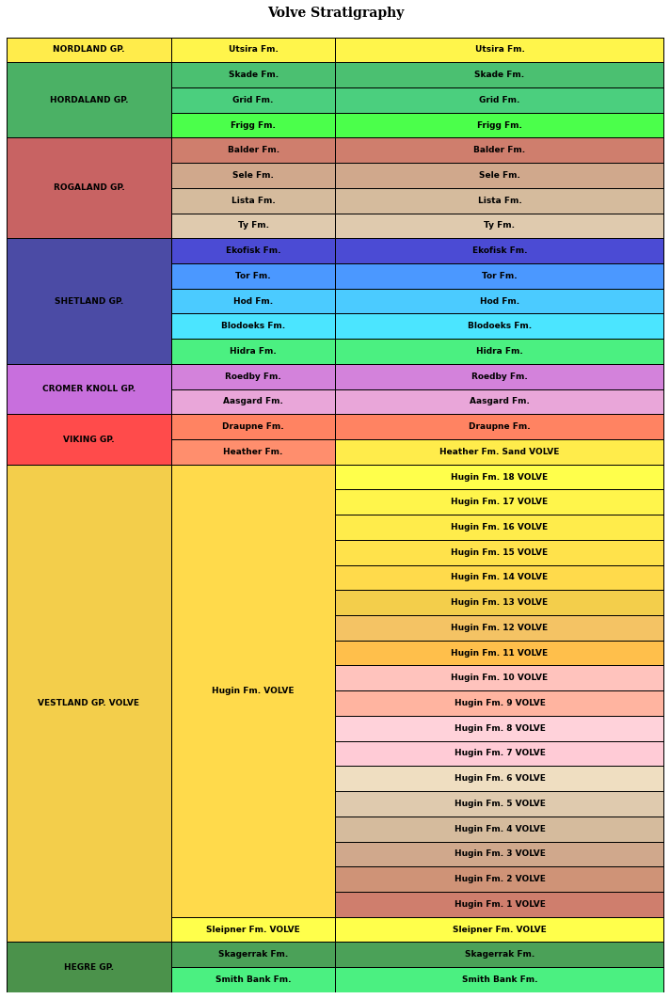

In [5]:
project.view_intervals(levelmax=2);

### Filter and color picks

In [6]:
project.picks.df['Field'] = 'Volve'
project.picks.df['Name'] = project.picks.df['Name'].str.replace('_',' ')
project.picks.df['Well UWI'] = project.picks.df['Well UWI'].str.replace('_',' ')

In [7]:
project.picks.select_interpreters(['STAT'])

In [8]:
project.assign_color_picks()

In [9]:
project.picks.display(nrows=10)

,Name,Well UWI,Depth (meters),Interp,Obs no,Field,Color
0,Utsira Fm. Top,NO 15/9-F-15 A,901.270000,STAT,1,Volve,#fff200
1,VIKING GP. Base,NO 15/9-19 BT2,4035.800000,STAT,1,Volve,#000000
2,Hugin Fm. Base,NO 15/9-F-15 C,3161.670000,STAT,1,Volve,#000000
3,Blodoeks Fm. Base,NO 15/9-F-15,3752.000000,STAT,1,Volve,#000000
4,Hugin Fm. Top,NO 15/9-F-1 A,3435.000000,STAT,1,Volve,#000000
5,Hugin Fm. Top,NO 15/9-F-4,3249.310000,STAT,1,Volve,#000000
6,Skagerrak Fm. 11 SLOE HUG Base,NO 15/9-19 SR,4356.180000,STAT,1,Volve,#000000
7,SHETLAND GP. Top,NO 15/9-F-12,2690.330000,STAT,1,Volve,#000080
8,CROMER KNOLL GP. Base,NO 15/9-F-10,5056.000000,STAT,1,Volve,#000000
9,Hidra Fm. Base,NO 15/9-F-15,3771.000000,STAT,1,Volve,#000000


## Add wells and log curves

In [10]:
selwellsnames = ['15_9-19_A', '15_9-19_BT2', '15_9-19_SR']
selwellsrenames = ['NO 15/9-19 A', 'NO 15/9-19 BT2', 'NO 15/9-19 SR']

project.wells = {}
project.add_wells(wellnames=selwellsnames, renames=selwellsrenames, computetvdss=True, verb=True)

Loading well 15_9-19_A with name NO 15/9-19 A (purpose = None)
Loading well 15_9-19_BT2 with name NO 15/9-19 BT2 (purpose = None)
Loading well 15_9-19_SR with name NO 15/9-19 SR (purpose = None)


Find out which wells had info and have been added to the project

In [11]:
selwellsnames = list(project.wells.keys())
selwellsnames

['NO 15/9-19 A', 'NO 15/9-19 BT2', 'NO 15/9-19 SR']

## Add checkshots

In [12]:
for wellname, checkshot in zip(checkshots.keys(), checkshots.values()):
    project.add_tdcurve(wellname, checkshot, tdname=checkshot, 
                        computeintervals=True,
                        computelog=True, verb=True)

Adding checkshot=NO_15_9-19A_TIME-CKS for well NO 15/9-19 A
Adding checkshot=NO_15_9-19BT2_TIME-CKS for well NO 15/9-19 BT2


## Visualize well trajectory

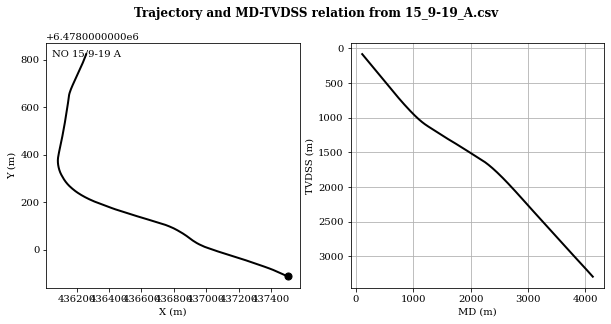

In [13]:
project.wells[selwellsnames[0]].trajectory.view();

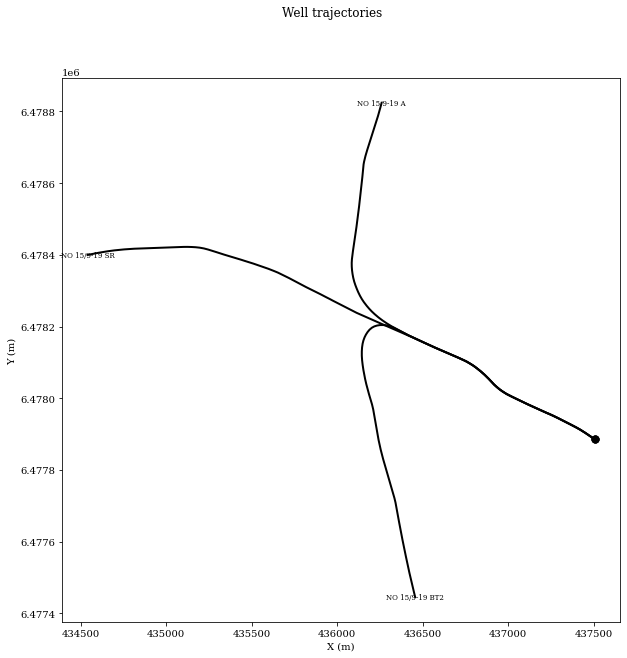

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
fig.suptitle('Well trajectories')
for wellname in selwellsnames:
    project.wells[wellname].trajectory.view_traj(ax=ax, wellname=True, fontsize=7, bbox=False)

## Visualize well logs

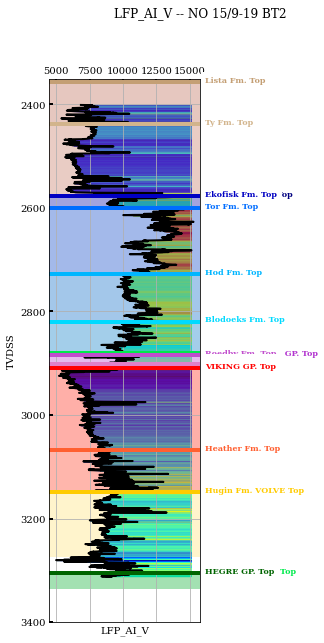

In [15]:
# Plot single log
fig, ax = project.wells[selwellsnames[1]].welllogs.visualize_logcurve('LFP_AI_V', depth='TVDSS', 
                                                                      colorcode=True, cmap='jet', 
                                                                      step=10, leftfill=False,
                                                                      ylim = (2350, 3400), 
                                                                      figsize=(7, 10))
project.wells[selwellsnames[1]].view_picks_and_intervals(ax, depth='TVDSS', level=[1,0], ylim=(2350, 3400))
fig.subplots_adjust(left=0.2, right=0.5)
fig.suptitle('LFP_AI_V -- ' + selwellsnames[1]);

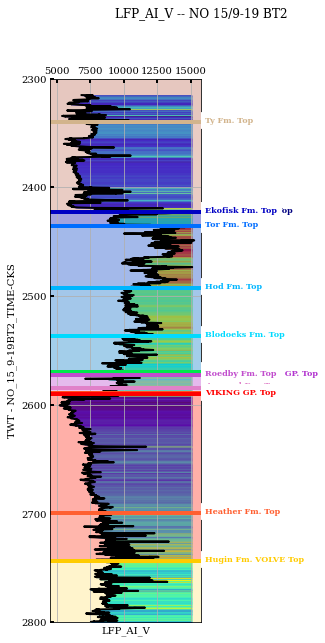

In [16]:
# Plot single log in twt
fig, ax = project.wells[selwellsnames[1]].welllogs.visualize_logcurve('LFP_AI_V', 
                                                                      depth='TWT - NO_15_9-19BT2_TIME-CKS', 
                                                                      colorcode=True, cmap='jet', 
                                                                      step=10, leftfill=False,
                                                                      ylim = (2300, 2800), 
                                                                      figsize=(7, 10))
project.wells[selwellsnames[1]].view_picks_and_intervals(ax, depth='TWT', twtcurve='NO_15_9-19BT2_TIME-CKS',
                                                         level=[1,0], ylim=(2300, 2800))
fig.subplots_adjust(left=0.2, right=0.5)
fig.suptitle('LFP_AI_V -- ' + selwellsnames[1]);

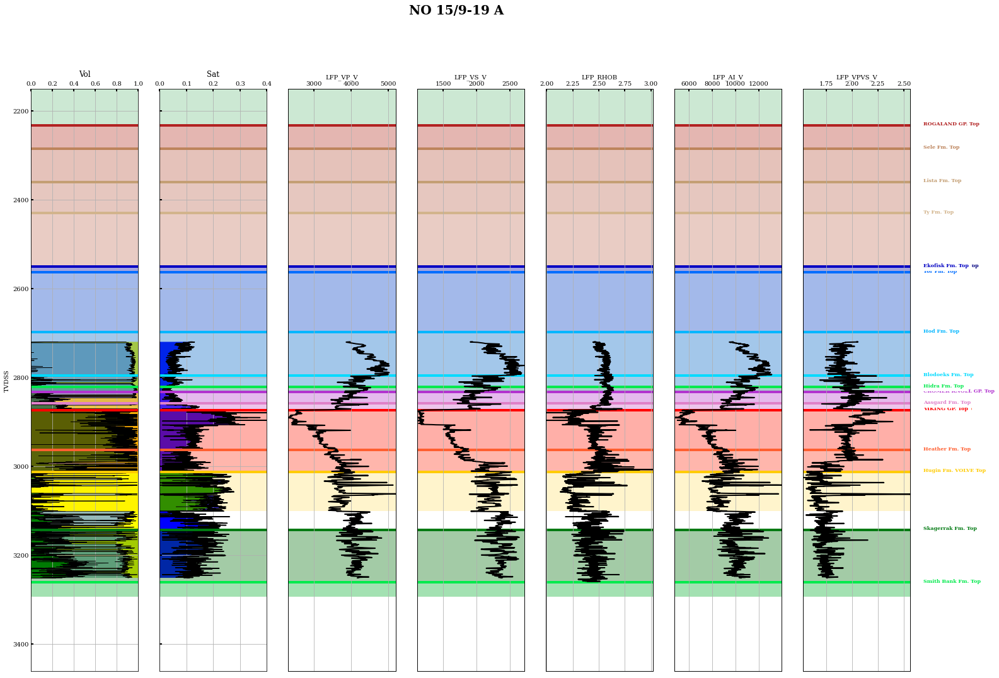

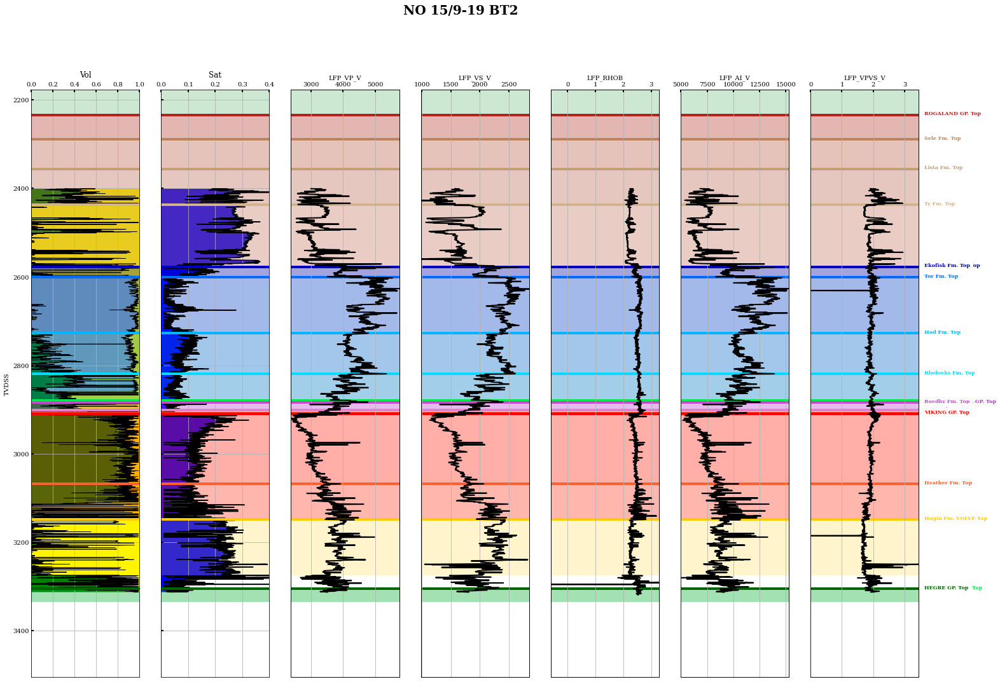

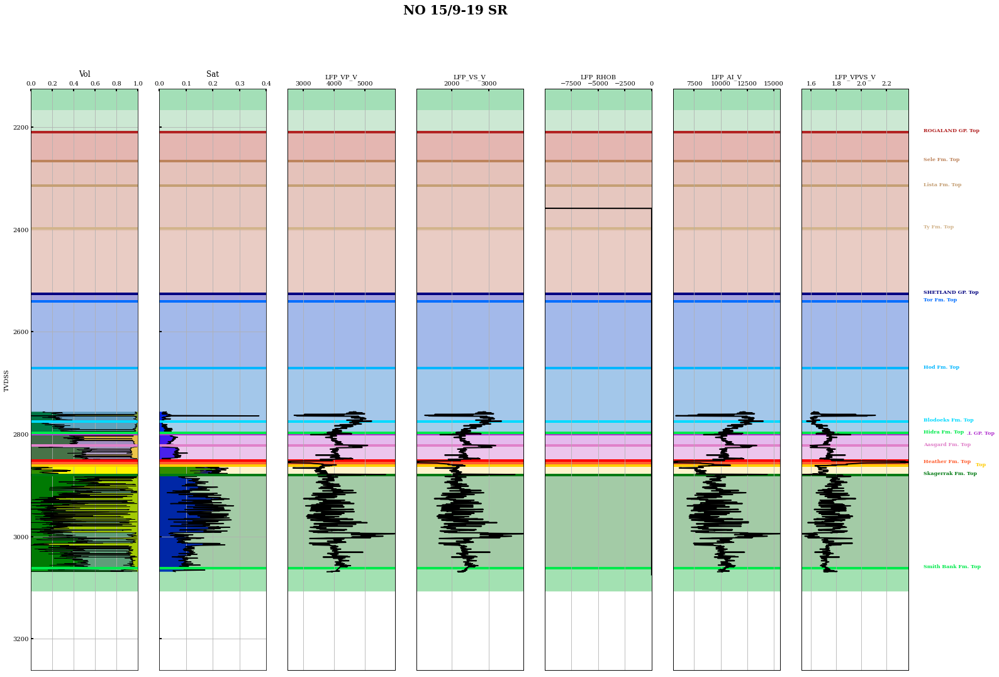

In [17]:
for wellname in selwellsnames:
    ylim = (project.wells[wellname].intervals[project.wells[wellname].intervals['Top'] == 'SHETLAND GP. Top']['Top TVDSS (meters)'].values[0]-400,
            project.wells[wellname].intervals[project.wells[wellname].intervals['Top'] == 'Smith Bank Fm. Top']['Top TVDSS (meters)'].values[0]+200)
    
    project.wells[wellname].view_logtrack(template='rock', lfp = True, 
                                          vp='VP_V', vs='VS_V',
                                          ai='AI_V', vpvs='VPVS_V', 
                                          rho='RHOB', vcoal='COAL', depth='TVDSS',
                                          intervals=[1, 0], 
                                          **dict(ylim=ylim, 
                                                 title=wellname,
                                                 figsize=(25,17)));

## Add horizon set

In [18]:
#project.add_horizonset(horizonset, horizonset_depth_files, horizonset_depth_names,
#                       horizonset_colors, domain='depth', verb=True)

project.add_horizonset(horizonset, horizonset_time_files, horizonset_time_names,
                       horizonset_colors, domain='time', verb=True)#, **dict(forceregular=True))

## Add Seismic

In [19]:
project.add_seismic(seismicfile_d, name=seismicfile_d,
                    type='Post', domain='depth', loadcube=True)
project.add_seismic(seismicfile_v, name=seismicfile_v,
                    type='Post', domain='depth', loadcube=True)
project.add_seismic(seismicfile_t, name=seismicfile_t,
                    type='Post', domain='time', loadcube=True)
project.add_seismic(seismicfile_vrms, name=seismicfile_vrms,
                    type='Post', domain='time', loadcube=True)
project.add_seismic(seismicfile_aiinv, name=seismicfile_aiinv,
                    type='Post', domain='depth', loadcube=True)
project.add_seismic(seismicfile_aiinvt, name=seismicfile_aiinvt,
                    type='Post', domain='time', loadcube=True);

Different visualizations

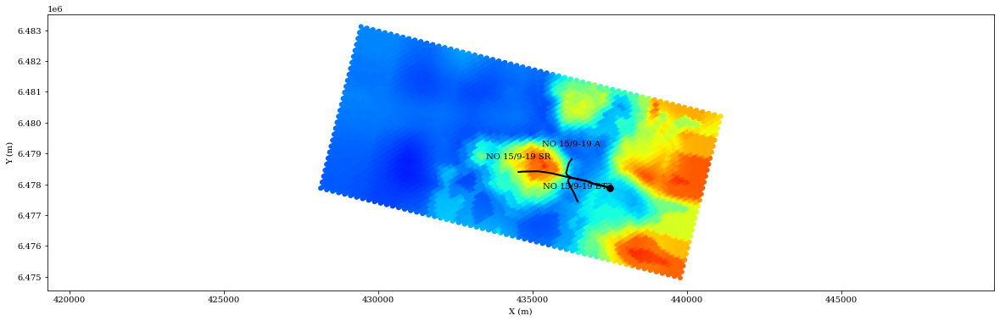

In [20]:
fig, ax = project.seismics[seismicfile_v]['data'].view_cdpslice(subsample=4, cmap='jet', clim=(2000, 3000))
for selwellsrename in selwellsrenames:
    project.wells[selwellsrename].trajectory.view_traj(ax=ax, color='k', labels=True, shift=(0, 500))

ValueError: 'c' argument has 72180 elements, which is inconsistent with 'x' and 'y' with size 72174.

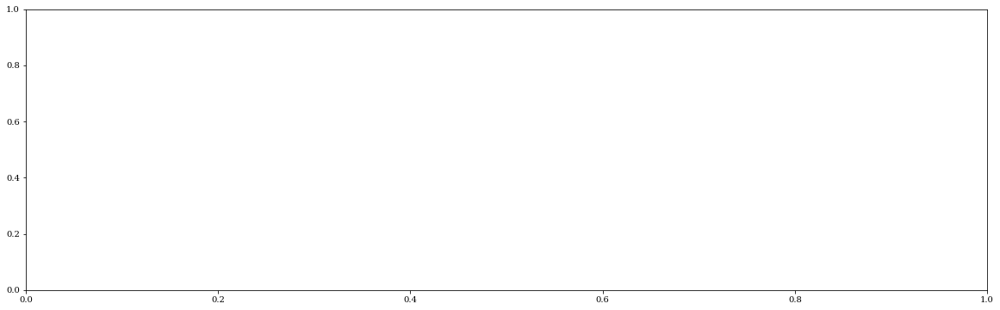

In [51]:
fig, ax = project.seismics[seismicfile_d]['data'].view_cdpslice(subsample=4, cmap='jet', clim=(2000, 3000))
for selwellsrename in selwellsrenames:
    project.wells[selwellsrename].trajectory.view_traj(ax=ax, color='k', labels=True, shift=(0, 500))

<class 'NoneType'> False


(<Figure size 1440x432 with 4 Axes>,
 array([[<AxesSubplot:title={'center':'IL slice at 10161'}, xlabel='XL', ylabel='Depth'>,
         <AxesSubplot:title={'center':'XL slice at 2321'}, xlabel='IL', ylabel='Depth'>],
        [<AxesSubplot:title={'center':'tslice at 404.0'}, xlabel='XL', ylabel='IL'>,
         <AxesSubplot:>]], dtype=object))

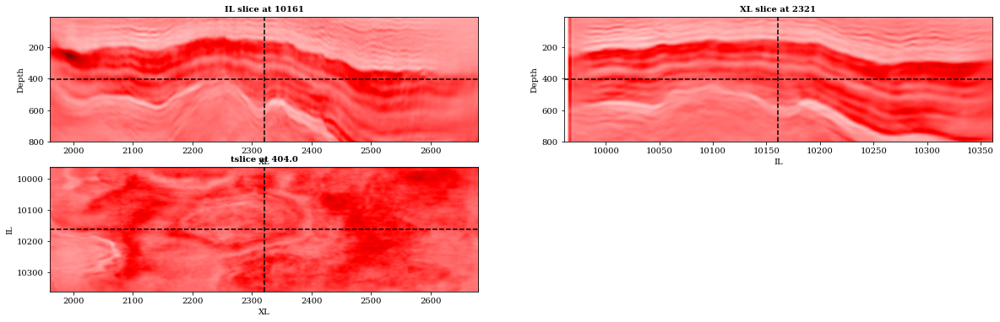

In [50]:
project.seismics[seismicfile_aiinv]['data'].view()

<class 'NoneType'> False
<class 'NoneType'> False


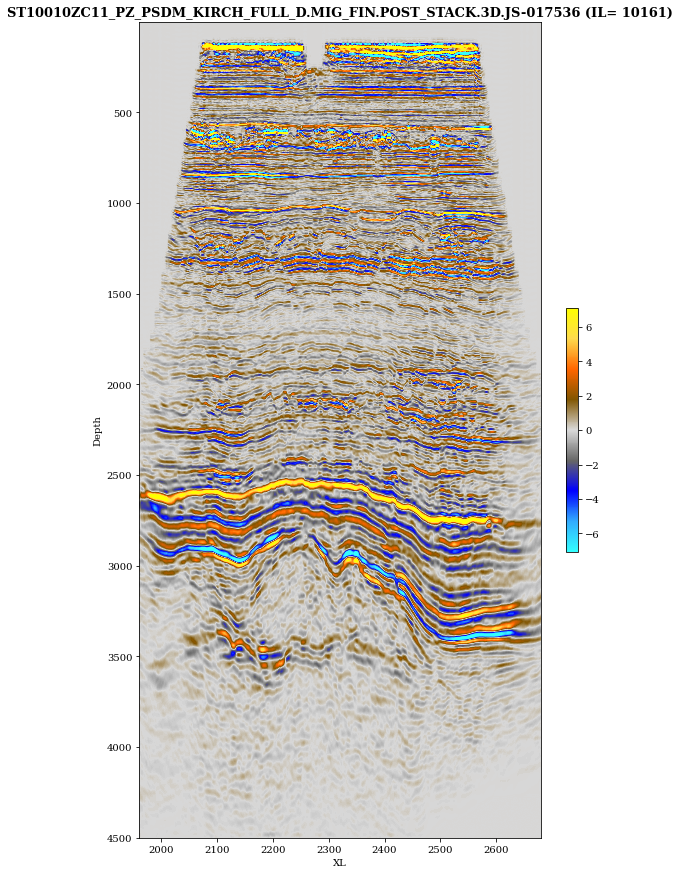

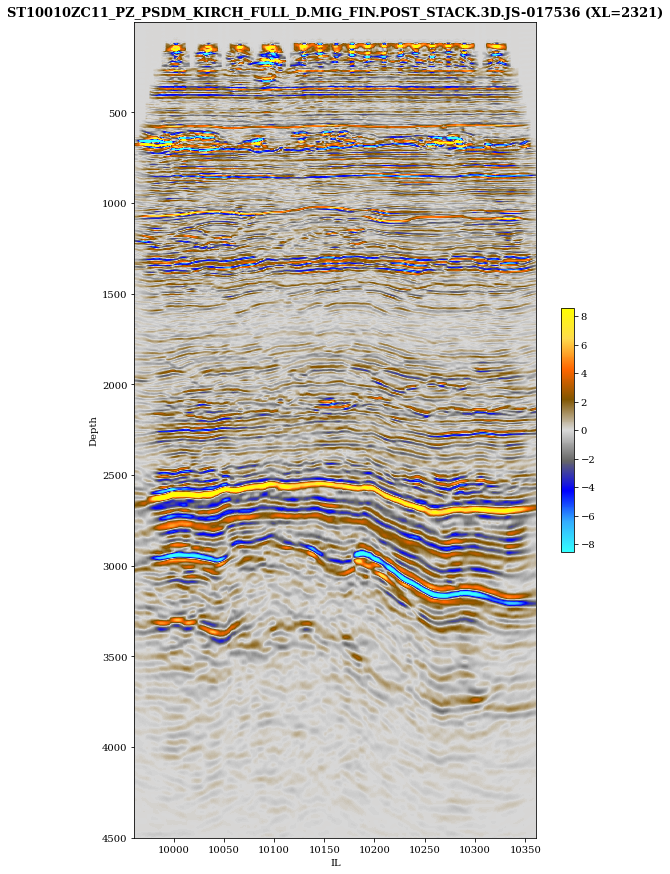

In [21]:
fig, ax = \
    project.seismics[seismicfile_d]['data'].view(cmap=cmap_amplitudepkdsg, which='il',
                                                 cbar=True, clip=0.3, interp='sinc',
                                                 tzoom_index=False,
                                                 title=seismicfile_d, figsize=(9, 15))

fig, ax = project.seismics[seismicfile_d]['data'].view(cmap=cmap_amplitudepkdsg, which='xl',
                                                       cbar=True, clip=0.3, interp='sinc',
                                                       tzoom_index=False,
                                                       title=seismicfile_d, figsize=(9, 15))

<class 'pysubsurface.objects.interpretation.Interpretation'> True
HERE
Loading surface ../volvedata/Surface/Horizon/Time/Ty_Fm_Top+ST10010_Full+STAT+TIME.dat...
Loading surface ../volvedata/Surface/Horizon/Time/SHETLAND_GP_Top+ST10010ZC11_Full+STAT+TIME.dat...
Loading surface ../volvedata/Surface/Horizon/Time/BCU+ST10010ZC11_Full+STAT+TIME.dat...
Loading surface ../volvedata/Surface/Horizon/Time/Hugin_Fm_Top+ST10010ZC11_Near_190314+STAT+TIME.dat...
Loading surface ../volvedata/Surface/Horizon/Time/Hugin_Fm_Base+ST10010ZC11_Near_190314+STAT+TIME.dat...
<class 'pysubsurface.objects.interpretation.Interpretation'> True


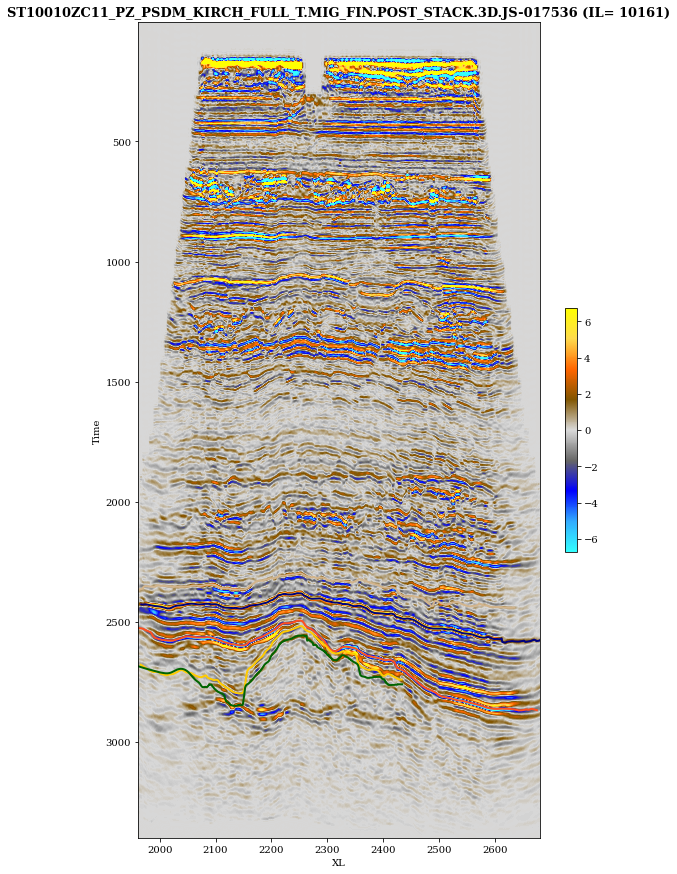

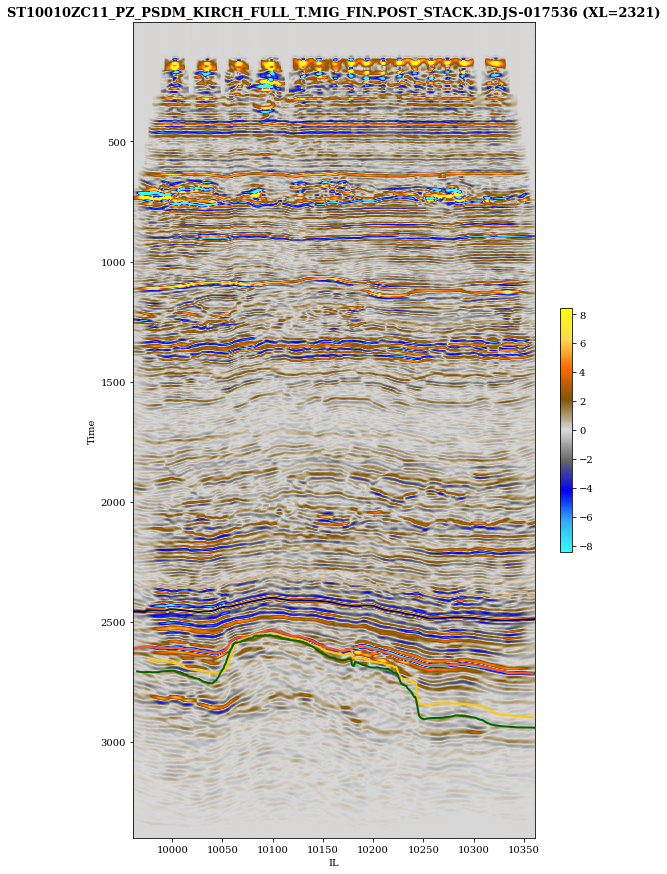

In [22]:
fig, ax = \
    project.seismics[seismicfile_t]['data'].view(cmap=cmap_amplitudepkdsg, which='il',
                                                 cbar=True, clip=0.3, interp='sinc',
                                                 horizons=project.horizonsets[horizonset+'-time']['data'],
                                                 horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                 tzoom_index=False,
                                                 title=seismicfile_t, figsize=(9, 15))

fig, ax = project.seismics[seismicfile_t]['data'].view(cmap=cmap_amplitudepkdsg, which='xl',
                                                       cbar=True, clip=0.3, interp='sinc',
                                                       horizons=project.horizonsets[horizonset+'-time']['data'],
                                                       horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                       tzoom_index=False,
                                                       title=seismicfile_t, figsize=(9, 15))

<class 'NoneType'> False
<class 'pysubsurface.objects.interpretation.Interpretation'> True


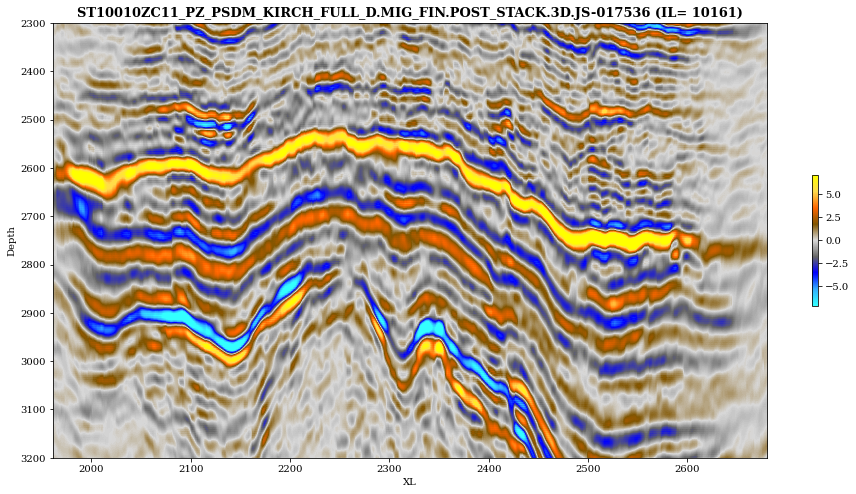

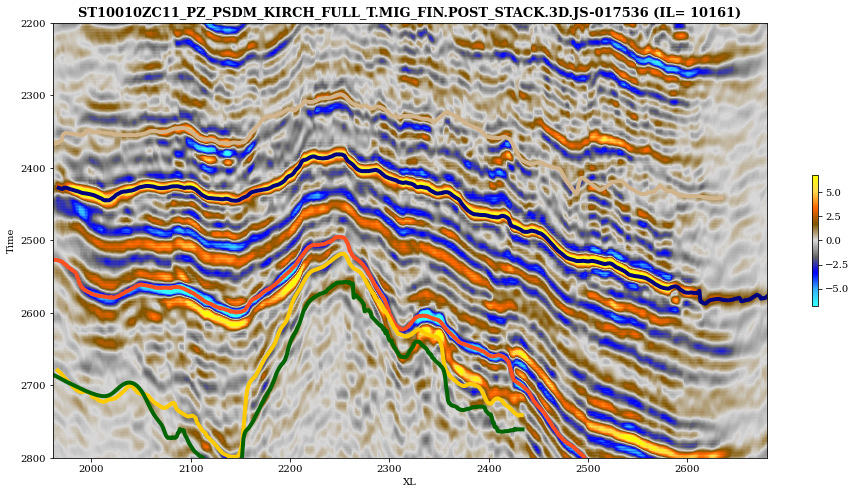

In [23]:
fig, ax = \
    project.seismics[seismicfile_d]['data'].view(cmap=cmap_amplitudepkdsg, which='il',
                                                 cbar=True, clip=0.3, interp='sinc',
                                                 #horizons=project.horizonsets[horizonset+'-depth']['data'],
                                                 #horcolors=project.horizonsets[horizonset+'-depth']['colors'],
                                                 hornames=False, horlw=4, tzoom_index=False, tzoom=[2300,3200],
                                                 title=seismicfile_d, figsize=(16, 8))

fig, ax = \
    project.seismics[seismicfile_t]['data'].view(cmap=cmap_amplitudepkdsg, which='il',
                                                 cbar=True, clip=0.3, interp='sinc',
                                                 horizons=project.horizonsets[horizonset+'-time']['data'],
                                                 horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                 hornames=False, horlw=4, tzoom_index=False, tzoom=[2200,2800],
                                                 title=seismicfile_t, figsize=(16, 8))

<class 'NoneType'> False
<class 'pysubsurface.objects.interpretation.Interpretation'> True


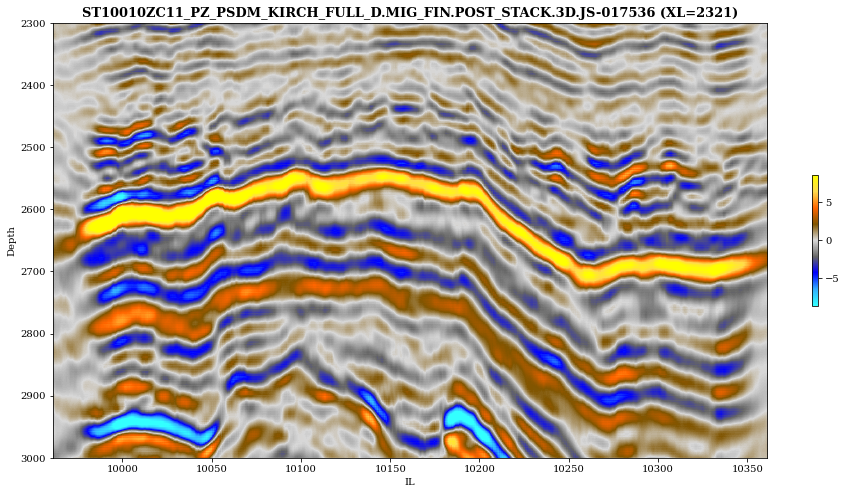

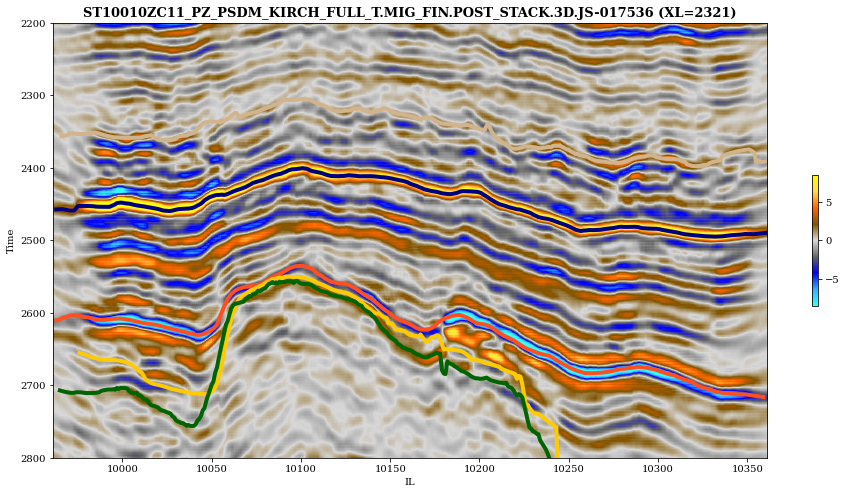

In [24]:
fig, ax = project.seismics[seismicfile_d]['data'].view(cmap=cmap_amplitudepkdsg, which='xl',
                                                       cbar=True, clip=0.3, interp='sinc',
                                                       hornames=False, horlw=4, tzoom_index=False, 
                                                       tzoom=[2300,3000],
                                                       title=seismicfile_d, figsize=(16, 8))

fig, ax = project.seismics[seismicfile_t]['data'].view(cmap=cmap_amplitudepkdsg, which='xl',
                                                       cbar=True, clip=0.3, interp='sinc',
                                                       horizons=project.horizonsets[horizonset+'-time']['data'],
                                                       horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                       hornames=False, horlw=4, tzoom_index=False, 
                                                       tzoom=[2200,2800],
                                                       title=seismicfile_t, figsize=(16, 8))

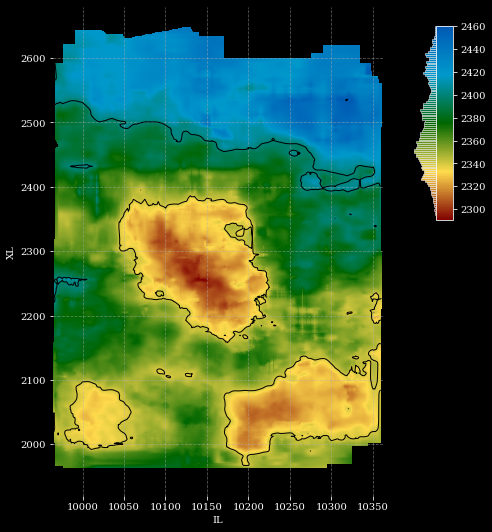

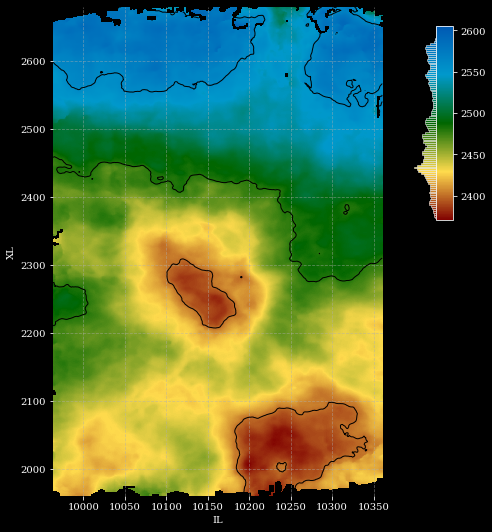

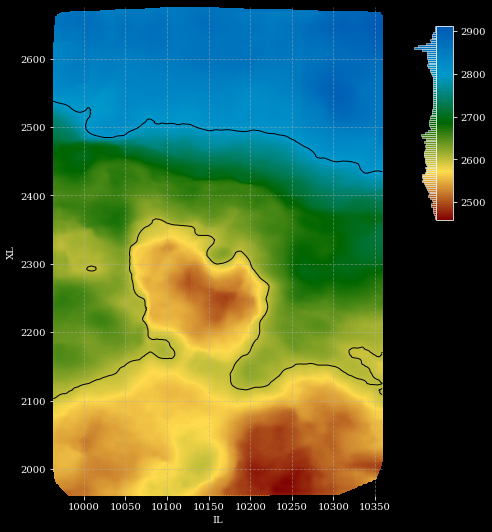

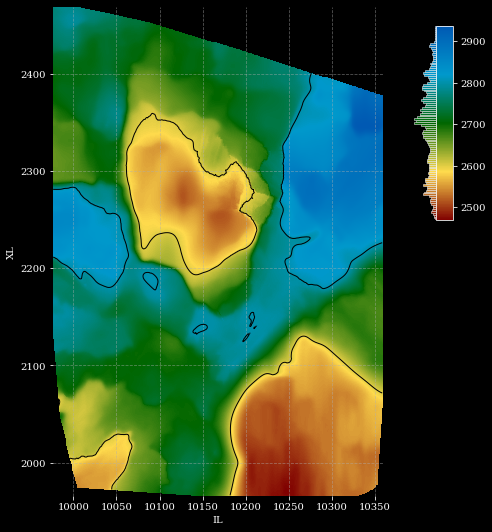

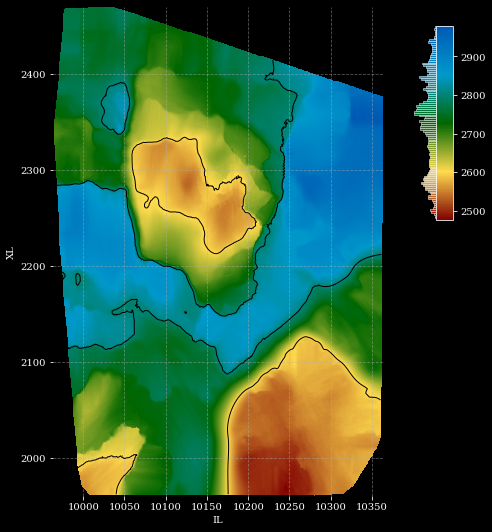

In [25]:
for horizon in project.horizonsets['official_streamer-time']['names']:
    fig, ax = project.view_surface(horizon, 'official_streamer-time',
                                   **dict(which='ilxl', 
                                          cmap=cmap_hordsg, originlower=True, 
                                          cbar=True, 
                                          chist=True, ncountour=2, 
                                          nhist=101, figsize=(8,9), 
                                          figstyle='black'))

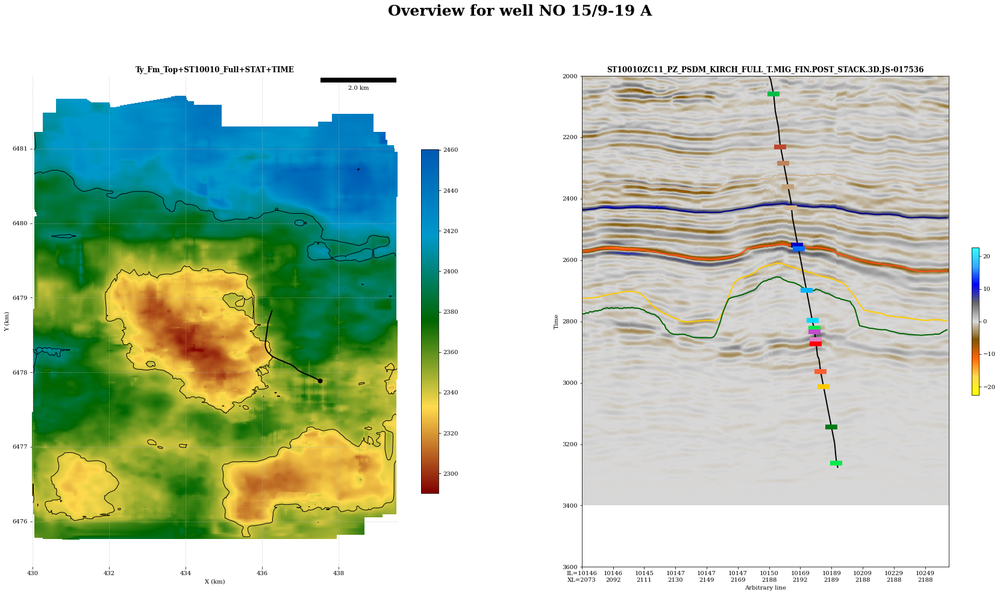

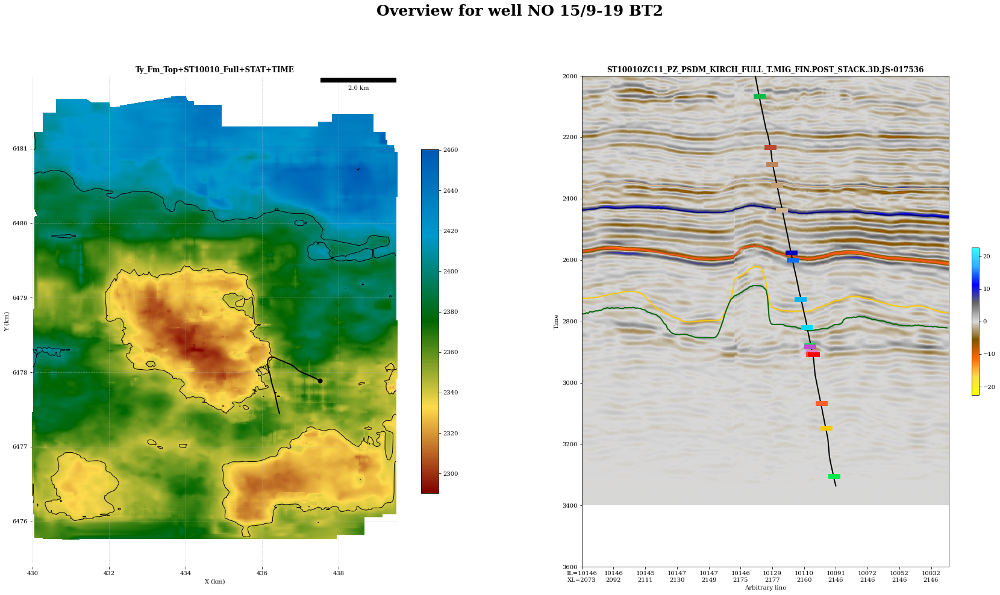

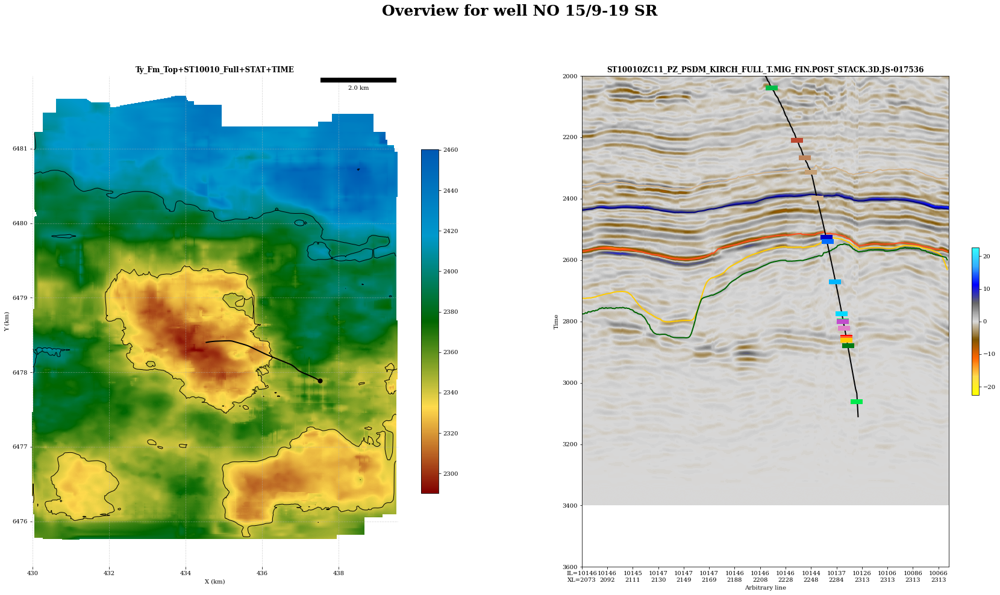

In [26]:
for wellname in selwellsnames:
    project.view_well_overview(wellname, horizonset+'-time',
                               project.horizonsets[horizonset+'-time']['names'][0],
                               seismicfile_t, tzoom_seismic=(2000,3600), level=[0, 1],
                               clip_seismic=0.4, cmap_seismic=cmap_amplitudepkdsg_r,
                               title='Overview for well {}'.format(wellname), savefig=True)

### Define average properties

In [27]:
def extract_mean(x):
    if isinstance(x, dict):
        return x['mean']
    else:
        return None

In [28]:
aveprops = {}

for level in [0, 1]:
    for selwell in selwellsnames:
        try:
            aveprops[selwell+' l%d' %level] = \
                project.wells[selwell].create_averageprops_intervals(level=level,
                                                                     vpname='LFP_VP_V',
                                                                     vsname='LFP_VS_V',
                                                                     rhoname='LFP_RHOB',
                                                                     ainame='LFP_AI_V',
                                                                     vpvsname='LFP_VPVS_V')
        except Exception as e:
            traceback.print_exc()

In [29]:
df_aveprops = {}
for selwell in selwellsnames:
    df_aveprops[selwell] = aveprops[selwell+' l0']['LFP_AI_V']
    
df_aveprops = pd.DataFrame(df_aveprops)
df_aveprops = df_aveprops.applymap(extract_mean)

df_aveprops['Mean'] = df_aveprops.mean(axis=1)
df_aveprops

,NO 15/9-19 A,NO 15/9-19 BT2,NO 15/9-19 SR,Mean
HEGRE GP.,10079.844537,9282.951464,9735.895962,9699.563988
HORDALAND GP.,NaN,NaN,NaN,NaN
ROGALAND GP.,NaN,7142.564146,NaN,7142.564146
SHETLAND GP.,11309.398001,11428.565072,11539.512130,11425.825068
CROMER KNOLL GP.,9762.087243,9638.790229,10552.880996,9984.586156
NORDLAND GP.,NaN,NaN,NaN,NaN
VIKING GP.,7839.790284,7881.723878,7845.248757,7855.587640


In [30]:
df_aveprops = {}
for selwell in selwellsnames:
    df_aveprops[selwell] = aveprops[selwell+' l1']['LFP_AI_V']
    
df_aveprops = pd.DataFrame(df_aveprops)
df_aveprops = df_aveprops.applymap(extract_mean)

df_aveprops['Mean'] = df_aveprops.mean(axis=1)
df_aveprops

,NO 15/9-19 A,NO 15/9-19 BT2,NO 15/9-19 SR,Mean
Skagerrak Fm.,10079.844537,NaN,9712.986786,9896.415661
Smith Bank Fm.,NaN,9282.951464,10276.665655,9779.808560
Utsira Fm.,NaN,NaN,NaN,NaN
Skade Fm.,NaN,NaN,NaN,NaN
Grid Fm.,NaN,NaN,NaN,NaN
Balder Fm.,NaN,NaN,NaN,NaN
Sele Fm.,NaN,NaN,NaN,NaN
Lista Fm.,NaN,7102.945907,NaN,7102.945907
Ty Fm.,NaN,7152.978295,NaN,7152.978295
Ekofisk Fm.,NaN,10047.354572,NaN,10047.354572


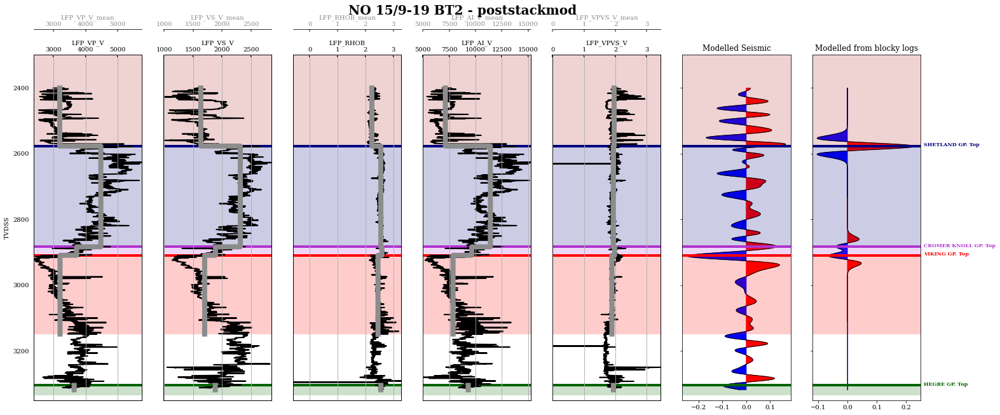

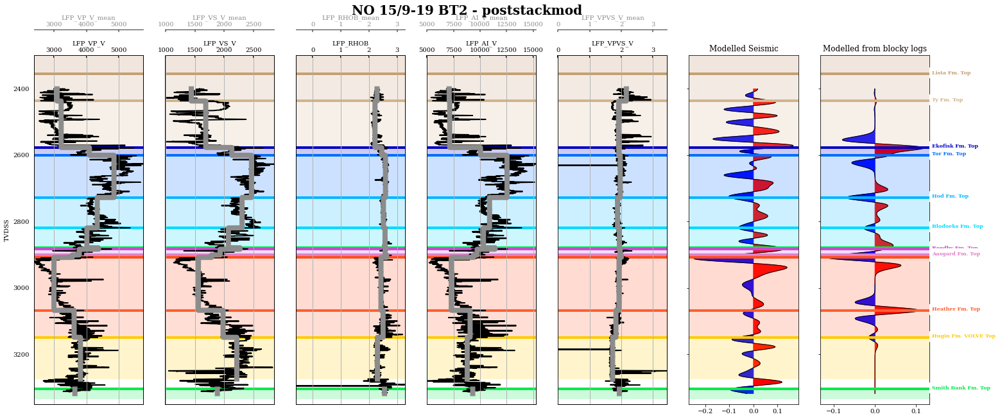

In [31]:
wav, twav, wcenter = ricker(np.arange(201)*0.004, 4, plotflag=False)

ylim = (2300, 3350)

for level in [0, 1]:
    project.wells["NO 15/9-19 BT2"].create_averageprops_intervals(level=level,
                                                                  vpname='LFP_VP_V',
                                                                  vsname='LFP_VS_V',
                                                                  rhoname='LFP_RHOB',
                                                                  ainame='LFP_AI_V',
                                                                  vpvsname='LFP_VPVS_V')

    project.view_logtrack("NO 15/9-19 BT2", **dict(template='poststackmod', lfp=True, vcoal='COAL', 
                                           depth='TVDSS', intervals=level, 
                                           wav=wav, seissampling=1.,
                                           **dict(ylim=ylim, vp='VP_V', vs='VS_V',
                                                  ai='AI_V', vpvs='VPVS_V', 
                                                  figsize=(25, 10))))

### AI models for and from Colored inversion

Finally let's try to calibrate the velocity model with the AI well log of 15/9-19 BT2 to obtain an  starting model for colored inversion to be used in https://github.com/mrava87/pylops_notebooks/blob/master/developement/SeismicInversion-Volve_absolute.ipynb.

We also import the outputs from different inversions and compare them with the AI log.

intercept -3952.262287973317, gradient 3.395256109348836


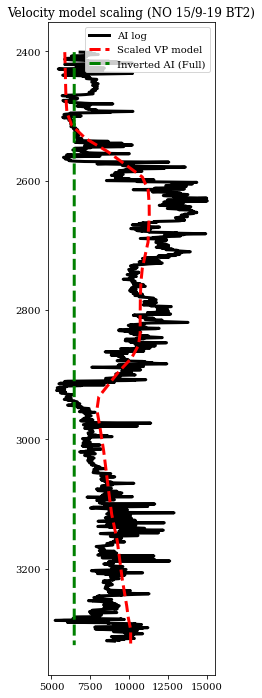

In [32]:
ilog = 1 # index of log for calibration
shiftlog = 46 # shift to apply to log to align with seismic in time/depth prior to calibration
nsmooth= 3

# extract vp from seismic velocity cube along well
vptraces = \
    [project.seismics[seismicfile_v]['data'].extract_trace_deviatedwell(project.wells[wellname]) 
     for wellname in selwellsnames]
aitraces = \
    [project.seismics[seismicfile_aiinv]['data'].extract_trace_deviatedwell(project.wells[wellname]) 
     for wellname in selwellsnames]

# extract ai from well logs
zlogs = [project.wells[wellname].welllogs.logs['TVDSS'] for wellname in selwellsnames]
ailogs = [project.wells[wellname].welllogs.logs['LFP_AI_V'] for wellname in selwellsnames]

# interpolate seismic at log level
vptraces = [np.interp(zlogs[i]+shiftlog, vptraces[i][1], vptraces[i][0]) for i in range(len(ailogs))]
aitraces = [np.interp(zlogs[i]+shiftlog, aitraces[i][1], aitraces[i][0]) for i in range(len(ailogs))]

# linear interpolation to find scaling an shift to fit seismic vp  and log ai
lm = LinearRegression()
vpall = vptraces[ilog]
aiall =  ailogs[ilog]
mask = np.isnan(vpall) | np.isnan(aiall)
lm.fit(vpall[~mask].reshape(-1, 1), aiall[~mask])
scalelog=lm.coef_[0]
leveluplog=lm.intercept_
print('intercept {}, gradient {}'.format(leveluplog, scalelog))

# visualize 
plt.figure(figsize=(3, 12))
plt.plot(filtfilt(np.ones(nsmooth)/nsmooth, 1, ailogs[ilog]), zlogs[ilog], 'k', lw=3, label='AI log')
plt.plot(leveluplog+scalelog*vptraces[ilog],  zlogs[ilog], '--r', lw=3, label='Scaled VP model')
plt.plot(aitraces[ilog],  zlogs[ilog], '--g', lw=3, label='Inverted AI (Full)')
plt.title('Velocity model scaling (%s)' % str(selwellsnames[ilog]))
plt.legend();
plt.gca().invert_yaxis()

We need to do the same with the rms velocity in time. 

First we compute the interval velocity and then find the scaling. As we cannot bring the log to time, we will find a relationship between these velocities and those in depth and rescale their relationship with the AI log

In [33]:
def vint2vrms(vint, t):
    nt = t.size
    dt = np.diff(t)
    vrms = np.zeros(nt)
    vrms[:-1] = np.cumsum(dt * (vint[:-1]**2));
    vrms[:-1] = np.sqrt(vrms[:-1] / t[:-1]-t[0])
    vrms[-1] = vrms[-2]
    return vrms

def vrms2vint(vrms, t):
    nt = t.size
    i1 = np.arange(0, nt-1)
    i2 = np.arange(1, nt)
    vint = np.zeros(nt)
    vrms2 = vrms ** 2
    vint[i1]= np.sqrt((vrms2[i2]*(t[i2] - t[0]) - vrms2[i1]*(t[i1] - t[0])) / (t[i2] - t[i1]))
    
    #find and process non-physical ones
    inp = np.where(vint<0);
    if len(inp):
        vint[inp] = np.nan
    return vint

In [34]:
vdepth = project.seismics[seismicfile_v]['data'].data
vrms = project.seismics[seismicfile_vrms]['data'].data
trms = project.seismics[seismicfile_vrms]['data'].tz

vint = np.zeros_like(vrms)
for iil in range(vrms.shape[0]):
    for ixl in range(vrms.shape[1]):
        vint[iil, ixl] = vrms2vint(vrms[iil, ixl], trms / 1000.)
vint = gaussian_filter(vint, sigma=30)

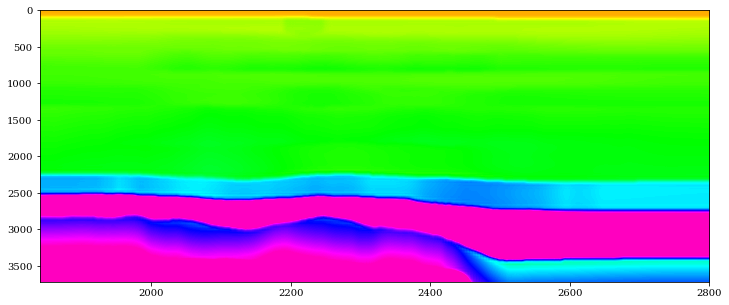

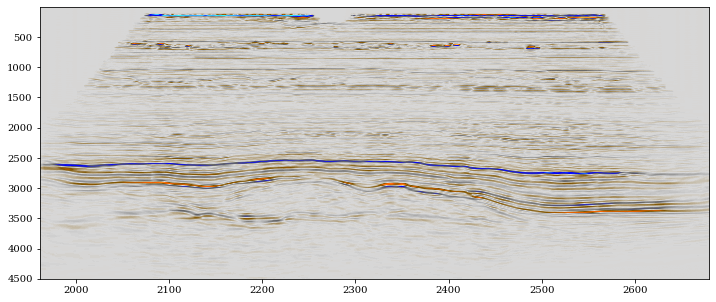

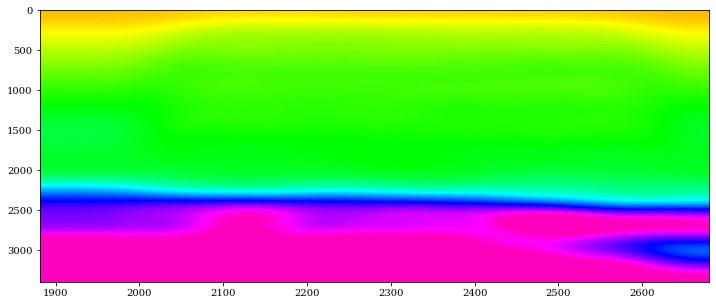

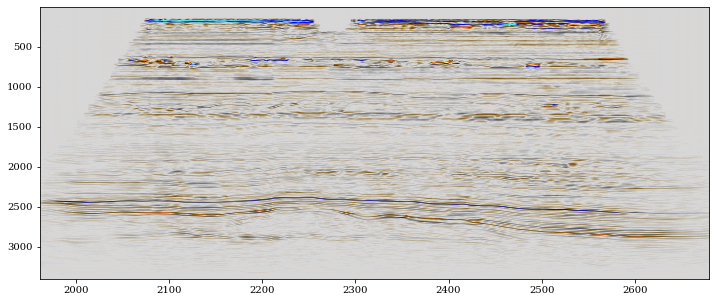

In [35]:
plt.figure(figsize=(12, 5))
plt.imshow(vdepth[vdepth.shape[0]//2, :, :-40].T, vmin=1000, vmax=4000, cmap='gist_rainbow', interpolation='sinc',
           extent=(project.seismics[seismicfile_v]['data'].xlines[0], project.seismics[seismicfile_v]['data'].xlines[-1],
                   project.seismics[seismicfile_v]['data'].tz[-40], project.seismics[seismicfile_v]['data'].tz[0]))
plt.axis('tight')

plt.figure(figsize=(12, 5))
plt.imshow(project.seismics[seismicfile_d]['data'].data[project.seismics[seismicfile_d]['data'].nil//2].T,
           cmap=cmap_amplitudepkdsg_r, vmin=-15, vmax=15, 
           extent=(project.seismics[seismicfile_d]['data'].xlines[0], project.seismics[seismicfile_d]['data'].xlines[-1],
                   project.seismics[seismicfile_d]['data'].tz[-1], project.seismics[seismicfile_d]['data'].tz[0]))
plt.axis('tight');

plt.figure(figsize=(12, 5))
plt.imshow(vint[vint.shape[0]//2].T, vmin=1000, vmax=4000, cmap='gist_rainbow', interpolation='sinc',
           extent=(project.seismics[seismicfile_vrms]['data'].xlines[0], project.seismics[seismicfile_vrms]['data'].xlines[-1],
                   project.seismics[seismicfile_vrms]['data'].tz[-1], project.seismics[seismicfile_vrms]['data'].tz[0]))
plt.axis('tight');

plt.figure(figsize=(12, 5))
plt.imshow(project.seismics[seismicfile_t]['data'].data[project.seismics[seismicfile_t]['data'].nil//2].T,
           cmap=cmap_amplitudepkdsg_r, vmin=-15, vmax=15, 
           extent=(project.seismics[seismicfile_t]['data'].xlines[0], project.seismics[seismicfile_t]['data'].xlines[-1],
                   project.seismics[seismicfile_t]['data'].tz[-1], project.seismics[seismicfile_t]['data'].tz[0]))
plt.axis('tight');

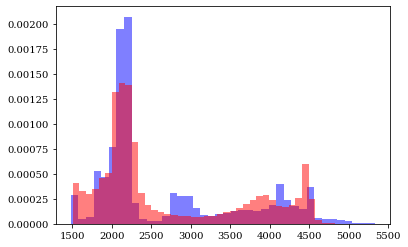

In [36]:
plt.figure()
plt.hist(vdepth[:, :, :-40].ravel()[::10], bins=40, alpha=0.5, color='b', density=True)
plt.hist(vint.ravel()[::10], bins=40, color='r', alpha=0.5, density=True);

As the two histograms are very similar, we are going to use the same scaling relationship with AI from well log found above.

## Extract and save seismic and horizons passing by a chosen well

### IL and XL closest to toe of well

In [37]:
wellname = "NO 15/9-19 BT2"
#wellname = "NO 15/9-19 A"

xhead, yhead = project.wells[wellname].trajectory.df.iloc[-1]['X Absolute'], project.wells[wellname].trajectory.df.iloc[-1]['Y Absolute']

ilwell, xlwell = _findclosest_point((xhead, yhead), project.seismics[seismicfile_t]['data'])

seismic_il = project.seismics[seismicfile_t]['data'].data[findclosest(project.seismics[seismicfile_t]['data'].ilines, ilwell)]
vel_il = project.seismics[seismicfile_v]['data'].data[findclosest(project.seismics[seismicfile_v]['data'].ilines, ilwell)]
vrms_il = project.seismics[seismicfile_vrms]['data'].data[findclosest(project.seismics[seismicfile_vrms]['data'].ilines, ilwell)]
ai_il = project.seismics[seismicfile_aiinv]['data'].data[findclosest(project.seismics[seismicfile_aiinv]['data'].ilines, ilwell)]
ait_il = project.seismics[seismicfile_aiinvt]['data'].data[findclosest(project.seismics[seismicfile_aiinvt]['data'].ilines, ilwell)]
horizons_il = {}
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    horizons_il[horname] = [project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].xl,
                            project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].data[findclosest(project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].il, ilwell)]]
       
seismic_xl = project.seismics[seismicfile_t]['data'].data[:, findclosest(project.seismics[seismicfile_t]['data'].xlines, xlwell)]
vel_xl = project.seismics[seismicfile_v]['data'].data[:, findclosest(project.seismics[seismicfile_v]['data'].xlines, xlwell)]
vrms_xl = project.seismics[seismicfile_vrms]['data'].data[:, findclosest(project.seismics[seismicfile_vrms]['data'].xlines, xlwell)]
ai_xl = project.seismics[seismicfile_aiinv]['data'].data[:, findclosest(project.seismics[seismicfile_aiinv]['data'].xlines, xlwell)]
ait_xl = project.seismics[seismicfile_aiinvt]['data'].data[:, findclosest(project.seismics[seismicfile_aiinvt]['data'].xlines, xlwell)]
horizons_xl = {}
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    horizons_xl[horname] = [project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].il,
                            project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].data[:, findclosest(project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].xl, xlwell)]]    

<class 'pysubsurface.objects.interpretation.Interpretation'> True
<class 'pysubsurface.objects.interpretation.Interpretation'> True


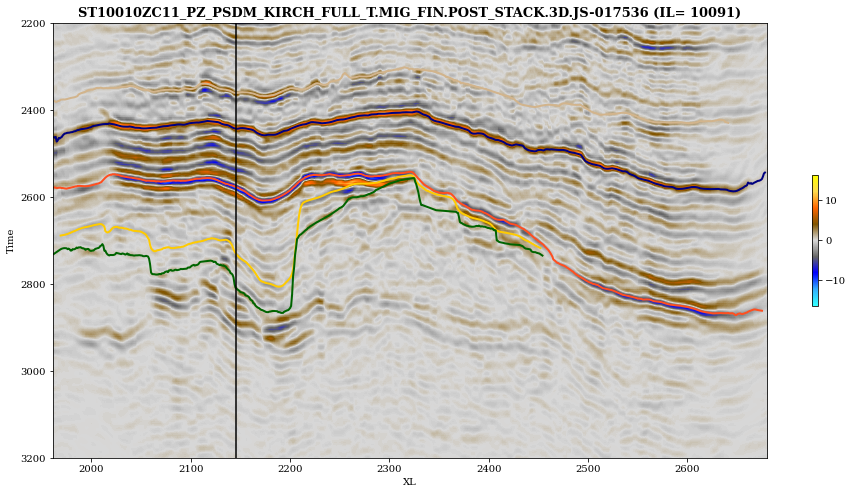

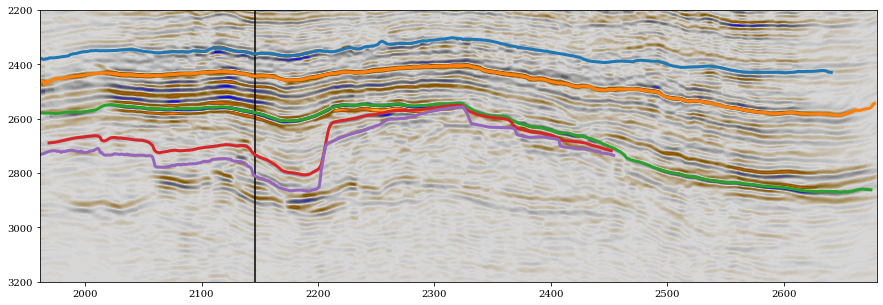

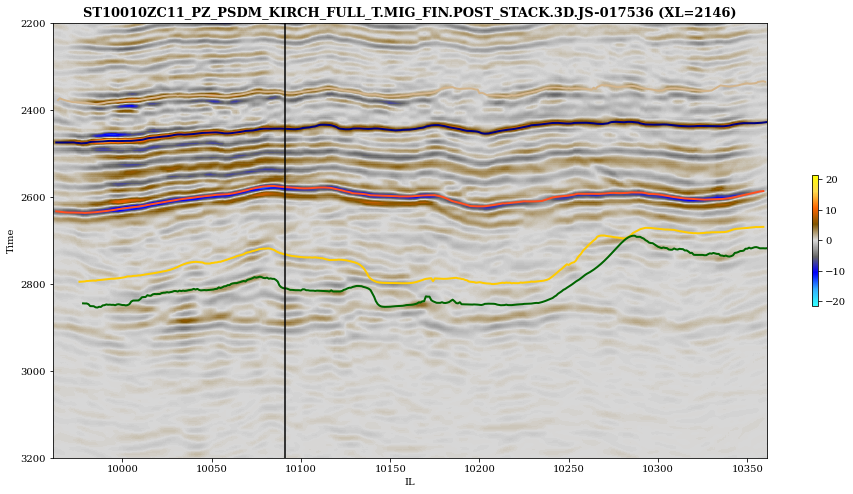

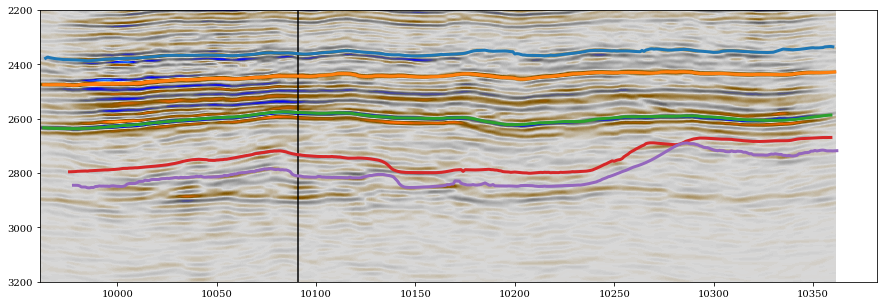

In [38]:
fig, ax = \
    project.seismics[seismicfile_t]['data'].view(cmap=cmap_amplitudepkdsg, which='il', 
                                                 ilplot=findclosest(project.seismics[seismicfile_t]['data'].ilines, ilwell),
                                                 cbar=True, clip=0.8, interp='sinc',
                                                 horizons=project.horizonsets[horizonset+'-time']['data'],
                                                 horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                 hornames=False, horlw=2, tzoom_index=False, tzoom=[2200,3200],
                                                 title=seismicfile_t, figsize=(16, 8))
ax.axvline(xlwell, color='k')

plt.figure(figsize=(15, 5))
plt.imshow(seismic_il.T, cmap=cmap_amplitudepkdsg, vmin=-15, vmax=15, interpolation='sinc',
          extent=(project.seismics[seismicfile_t]['data'].xlines[0], project.seismics[seismicfile_t]['data'].xlines[-1],
                  project.seismics[seismicfile_t]['data'].tz[-1], project.seismics[seismicfile_t]['data'].tz[0]))
plt.axvline(xlwell, color='k')
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    plt.plot(horizons_il[horname][0], horizons_il[horname][1], lw=3)
plt.axis('tight')
plt.ylim(3200,2200)

fig, ax = \
    project.seismics[seismicfile_t]['data'].view(cmap=cmap_amplitudepkdsg, which='xl', 
                                                 xlplot=findclosest(project.seismics[seismicfile_t]['data'].xlines, xlwell),
                                                 cbar=True, clip=0.8, interp='sinc',
                                                 horizons=project.horizonsets[horizonset+'-time']['data'],
                                                 horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                 hornames=False, horlw=2, tzoom_index=False, tzoom=[2200,3200],
                                                 title=seismicfile_t, figsize=(16, 8))
ax.axvline(ilwell, color='k')

plt.figure(figsize=(15, 5))
plt.imshow(seismic_xl.T, cmap=cmap_amplitudepkdsg, vmin=-15, vmax=15, interpolation='sinc',
          extent=(project.seismics[seismicfile_t]['data'].ilines[0], project.seismics[seismicfile_t]['data'].ilines[-1],
                  project.seismics[seismicfile_t]['data'].tz[-1], project.seismics[seismicfile_t]['data'].tz[0]))
plt.axvline(ilwell, color='k')
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    plt.plot(horizons_xl[horname][0], horizons_xl[horname][1], lw=3)
plt.axis('tight')
plt.ylim(3200,2200);

In [39]:
import pysubsurface
from pysubsurface.objects.interpretation import Interpretation

type(project.horizonsets[horizonset+'-time']['data']) == pysubsurface.objects.Interpretation

True

<class 'pysubsurface.objects.interpretation.Interpretation'> True
<class 'pysubsurface.objects.interpretation.Interpretation'> True


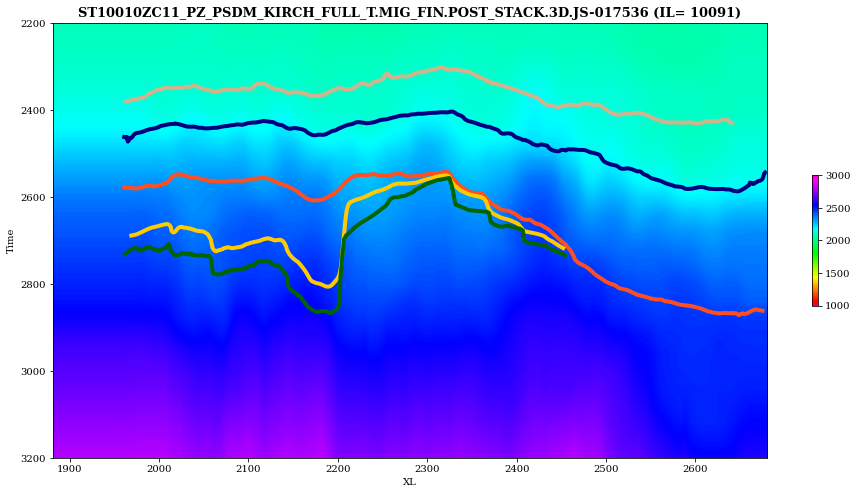

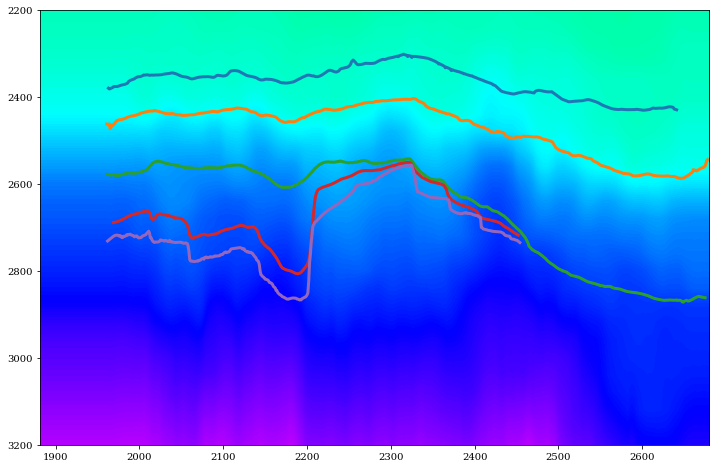

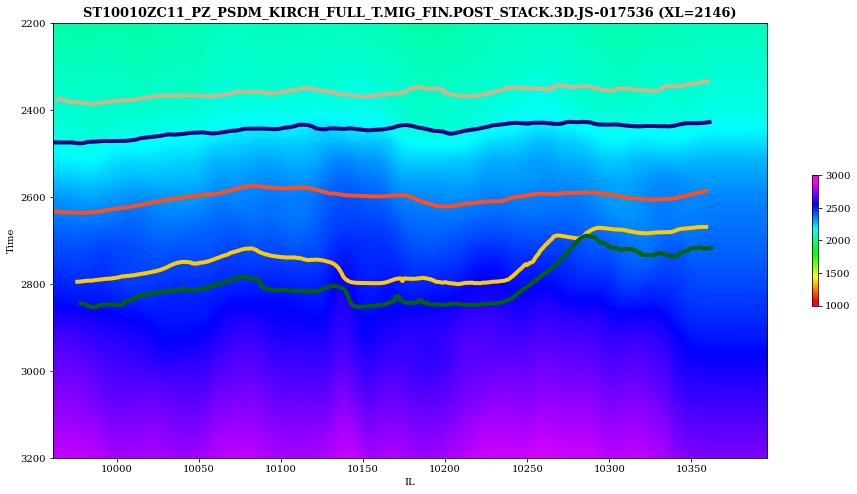

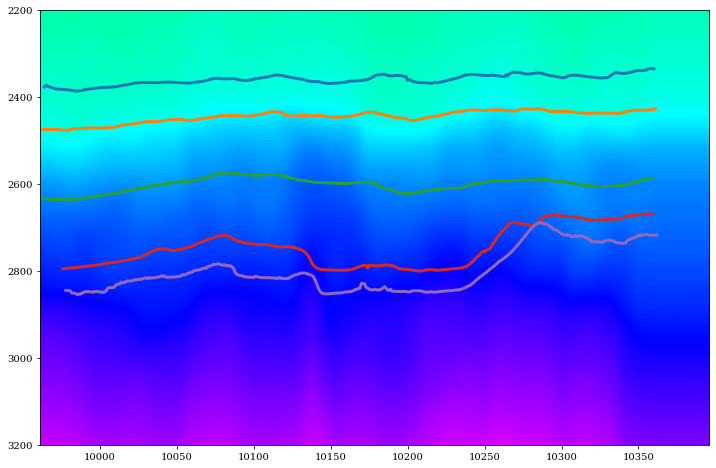

In [40]:
fig, ax = \
    project.seismics[seismicfile_vrms]['data'].view(cmap='gist_rainbow', which='il', 
                                                    ilplot=findclosest(project.seismics[seismicfile_vrms]['data'].ilines, ilwell),
                                                    cbar=True, interp='sinc', clim=(1000, 3000),
                                                    horizons=project.horizonsets[horizonset+'-time']['data'],
                                                    horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                    hornames=False, horlw=4, tzoom_index=False, tzoom=[2200,3200],
                                                    title=seismicfile_t, figsize=(16, 8))

plt.figure(figsize=(12, 8))
plt.imshow(vrms_il.T, vmin=1000, vmax=3000, cmap='gist_rainbow', interpolation='sinc',
          extent=(project.seismics[seismicfile_vrms]['data'].xlines[0], project.seismics[seismicfile_vrms]['data'].xlines[-1],
                  project.seismics[seismicfile_vrms]['data'].tz[-1], project.seismics[seismicfile_vrms]['data'].tz[0]))
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    plt.plot(horizons_il[horname][0], horizons_il[horname][1], lw=3)
plt.axis('tight')
plt.ylim(3200,2200);


fig, ax = \
    project.seismics[seismicfile_vrms]['data'].view(cmap='gist_rainbow', which='xl', 
                                                 xlplot=findclosest(project.seismics[seismicfile_vrms]['data'].xlines, xlwell),
                                                 cbar=True, interp='sinc', clim=(1000, 3000),
                                                 horizons=project.horizonsets[horizonset+'-time']['data'],
                                                 horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                 hornames=False, horlw=4, tzoom_index=False, tzoom=[2200,3200],
                                                 title=seismicfile_t, figsize=(16, 8))

plt.figure(figsize=(12, 8))
plt.imshow(vrms_xl.T, vmin=1000, vmax=3000, cmap='gist_rainbow', interpolation='sinc',
           extent=(project.seismics[seismicfile_vrms]['data'].ilines[0], project.seismics[seismicfile_vrms]['data'].ilines[-1],
                   project.seismics[seismicfile_vrms]['data'].tz[-1], project.seismics[seismicfile_vrms]['data'].tz[0]))
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    plt.plot(horizons_xl[horname][0], horizons_xl[horname][1], lw=3)
plt.axis('tight')
plt.ylim(3200,2200);

### Along well trajectory

In [41]:
def extract_wellfence(well, seismic, ilin, ilend, xlin, xlend):
    ilwell, xlwell = \
            _findclosest_well_seismicsections(well, seismic, traj=True)
    ilvertices = [ilin, ] + list(ilwell) + [ilend,]
    xlvertices = [xlin, ] + list(xlwell) + [xlend,]
    
    ilsext, xlsext, iilsext, ixlsext, nedgesext = \
        _extract_arbitrary_path(ilvertices, xlvertices,
                                seismic.dil, 
                                seismic.dxl,
                                seismic.ilines[0], 
                                seismic.xlines[0])
    wellfence = np.zeros((len(ilsext), seismic.ntz))
    for i in range(len(ilsext)):
        wellfence[i] = seismic.data[iilsext[i], ixlsext[i]]
    return wellfence, ilwell, xlwell, ilsext, xlsext

In [42]:
seismicd_fence, ilwell, xlwell, ilsext, xlsext = \
    extract_wellfence(project.wells[wellname], project.seismics[seismicfile_d]['data'], 
                      10150, 10091, 2000, 2650)
seismict_fence = extract_wellfence(project.wells[wellname], project.seismics[seismicfile_t]['data'], 
                                   10150, 10070, 2000, 2650)[0]
vel_fence = extract_wellfence(project.wells[wellname], project.seismics[seismicfile_v]['data'], 
                              10150, 10091, 2000, 2650)[0]
vrms_fence = extract_wellfence(project.wells[wellname], project.seismics[seismicfile_vrms]['data'], 
                               10150, 10091, 2000, 2650)[0]
aiinv_fence = extract_wellfence(project.wells[wellname], project.seismics[seismicfile_aiinv]['data'], 
                               10150, 10091, 2000, 2650)[0]
aiinvt_fence = extract_wellfence(project.wells[wellname], project.seismics[seismicfile_aiinvt]['data'], 
                               10150, 10091, 2000, 2650)[0]

# extract trace along well (depth)
aiextr, ztrace = project.seismics[seismicfile_aiinv]['data'].extract_trace_deviatedwell(project.wells[wellname])

tz = project.seismics[seismicfile_aiinv]['data'].tz
dtz = project.seismics[seismicfile_aiinvt]['data'].dtz
tz0 = project.seismics[seismicfile_aiinv]['data'].tz[0]
zwell = project.wells[wellname].trajectory.df['TVDSS'].values
zwell = spint.LinearNDInterpolator(np.vstack((ilwell, xlwell)).T, zwell)(np.vstack((ilsext, xlsext)).T)

izwellfence = (np.round(zwell - tz0) / dtz).astype(np.int)
aiextr1 = np.array([aiinv_fence[i, iz] if iz > 0 and iz < len(tz) 
                   else np.nan for i, iz in enumerate(izwellfence)])

# extract trace along well (time)
tz = project.seismics[seismicfile_aiinvt]['data'].tz
dtz = project.seismics[seismicfile_aiinvt]['data'].dtz
tz0 = project.seismics[seismicfile_aiinvt]['data'].tz[0]
twell = np.interp(project.wells[wellname].trajectory.df['TVDSS'].values,
                  project.wells[wellname].checkshots['NO_15_9-19BT2_TIME-CKS'].df['Depth (meters)'].values,
                  project.wells[wellname].checkshots['NO_15_9-19BT2_TIME-CKS'].df['Time (ms)'].values)
twell = spint.LinearNDInterpolator(np.vstack((ilwell, xlwell)).T, twell)(np.vstack((ilsext, xlsext)).T)

itwellfence = (np.round(twell - tz0) / dtz).astype(np.int)
aiextr1_t = np.array([aiinvt_fence[i, iz] if iz > 0 and iz < len(tz) 
                      else np.nan for i, iz in enumerate(itwellfence)])

In [43]:
# extract horizons along fence
horizons_fence = {}
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    horizons_fence[horname] = np.zeros(len(ilsext))
    for i, (il, xl) in enumerate(zip(ilsext, xlsext)):
        iil = findclosest(project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].il, il)
        ixl = findclosest(project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].xl, xl)
        horizons_fence[horname][i] = project.horizonsets[horizonset+'-time']['data'].surfaces[ihor].data[iil, ixl]

ValueError: 'c' argument has 72180 elements, which is inconsistent with 'x' and 'y' with size 72174.

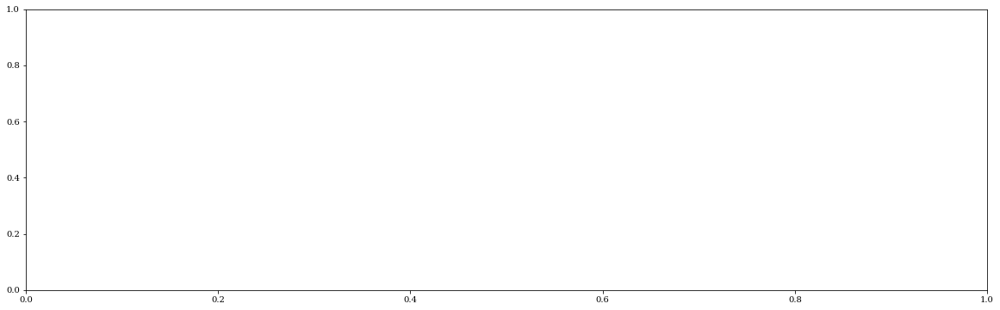

In [44]:
fig, ax = project.seismics[seismicfile_aiinv]['data'].view_cdpslice(subsample=4)#, ilxl=True);
ax.plot(xlsext, ilsext, 'k', lw=3)
ax.plot(xlwell, ilwell, 'k', lw=6);

project.wells[wellname].view_in_seismicsection(project.seismics[seismicfile_t]['data'], 
                                               domain='time', twtcurve='NO_15_9-19BT2_TIME-CKS',
                                               extend=100,
                                               surface=project.horizonsets[horizonset+'-time']['data'].surfaces[2],
                                               cmapsurface=cmap_hordsg,
                                               figsize=(15, 9),
                                               **dict(cmap='seismic', 
                                                      clim=[-15, 15], cbar=True, 
                                                      tzoom=(2000, 3000), tzoom_index=False,
                                                      horizons=project.horizonsets[horizonset+'-time']['data'],
                                                      horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                      hornames=False, horlw=4, ));

plt.figure(figsize=(13, 9))
plt.imshow(seismict_fence.T, cmap='seismic', vmin=-15, vmax=15,
           extent=[0, aiinv_fence.shape[0], 
                   project.seismics[seismicfile_t]['data'].tz[-1], 
                   project.seismics[seismicfile_t]['data'].tz[0]])
plt.plot(np.arange(len(zwell)), zwell, 'k')
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    plt.plot(horizons_fence[horname], project.horizonsets[horizonset+'-time']['colors'][ihor], lw=3)
plt.title('Seismic fence - Time')
plt.axis('tight')
plt.ylim(3000, 2000)

plt.figure(figsize=(13, 9))
plt.imshow(aiinv_fence.T, cmap=cmap_hordsg, vmin=2000, vmax=17000,
           extent=[0, aiinv_fence.shape[0], 
                   project.seismics[seismicfile_aiinv]['data'].tz[-1], 
                   project.seismics[seismicfile_aiinv]['data'].tz[0]])
plt.plot(np.arange(len(zwell)), zwell, 'k')
plt.title('AI fence - Depth')
plt.axis('tight')
plt.ylim(3000, 2000)

project.wells[wellname].view_in_seismicsection(project.seismics[seismicfile_aiinvt]['data'], 
                                               domain='time', twtcurve='NO_15_9-19BT2_TIME-CKS',
                                               extend=100,
                                               surface=project.horizonsets[horizonset+'-time']['data'].surfaces[2],
                                               cmapsurface=cmap_hordsg,
                                               figsize=(15, 9),
                                               **dict(cmap=cmap_hordsg, 
                                                      clim=[2000, 17000], cbar=True,
                                                      tzoom=(2000, 3000), tzoom_index=False,
                                                      horizons=project.horizonsets[horizonset+'-time']['data'],
                                                      horcolors=project.horizonsets[horizonset+'-time']['colors'],
                                                      hornames=False, horlw=4, ));

plt.figure(figsize=(13, 9))
plt.imshow(aiinvt_fence.T, cmap=cmap_hordsg, vmin=2000, vmax=17000,
           extent=[0, aiinv_fence.shape[0], 
                   project.seismics[seismicfile_aiinvt]['data'].tz[-1], 
                   project.seismics[seismicfile_aiinvt]['data'].tz[0]])
plt.plot(np.arange(len(twell)), twell, 'k')
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    plt.plot(horizons_fence[horname], project.horizonsets[horizonset+'-time']['colors'][ihor], lw=3)
plt.title('AI fence - Time')
plt.axis('tight')
plt.ylim(3000, 2000);

In [ ]:
# AI traces along well
plt.figure(figsize=(10, 3))
plt.plot(project.wells[wellname].welllogs.logs['TVDSS']+46, 
         filtfilt(np.ones(nsmooth)/nsmooth, 1, project.wells[wellname].welllogs.logs['LFP_AI_V']),  
         'k', lw=3, label='AI log (z)')
plt.plot(ztrace, aiextr, 'r', lw=2)
plt.plot(zwell, aiextr1, 'g', lw=2);

plt.figure(figsize=(10, 3))
plt.plot(project.wells[wellname].welllogs.logs['TWT - NO_15_9-19BT2_TIME-CKS']+25, 
         filtfilt(np.ones(nsmooth)/nsmooth, 1, project.wells[wellname].welllogs.logs['LFP_AI_V']),  
         'k', lw=3, label='AI log (t)')
plt.plot(twell, aiextr1_t, 'g', lw=2);

Extract AI along well trajectory at subsample resolution

In [ ]:
xfence = np.arange(0, aiinv_fence.shape[0]) 
xfence_int = np.arange(0, aiinv_fence.shape[0], 0.2)
twell_int = np.interp(xwell_int, np.arange(len(twell))[~np.isnan(twell)],
                      twell[~np.isnan(twell)], left=np.nan, right=np.nan)

aiextr1_t_int = RegularGridInterpolator((xfence, project.seismics[seismicfile_aiinvt]['data'].tz),
                                        aiinvt_fence, 
                                        bounds_error=False,
                                        fill_value=np.nan)(np.vstack((xfence_int, twell_int)).T)

plt.figure(figsize=(10, 3))
plt.plot(project.wells[wellname].welllogs.logs['TWT - NO_15_9-19BT2_TIME-CKS']+25, 
         filtfilt(np.ones(nsmooth)/nsmooth, 1, project.wells[wellname].welllogs.logs['LFP_AI_V']),  
         'k', lw=3, label='AI log (t)')
plt.plot(twell, aiextr1_t, '--g')
plt.plot(twell_int, aiextr1_t_int, 'g', lw=2);

Finally we try to apply some squeeze to the well log time axis

In [ ]:
twell_squeeze = project.wells[wellname].welllogs.logs['TWT - NO_15_9-19BT2_TIME-CKS'].copy()+27
twell_squeeze[1500:] = twell_squeeze[1500] + 0.85*(twell_squeeze[1500:] -twell_squeeze[1500])

plt.figure(figsize=(10, 3))
plt.plot(twell_squeeze, 
         filtfilt(np.ones(nsmooth)/nsmooth, 1, project.wells[wellname].welllogs.logs['LFP_AI_V']),  
         'k', lw=3, label='AI log (t)')
plt.plot(twell, aiextr1_t, '--g')
plt.plot(twell_int, aiextr1_t_int, 'g', lw=2);

# Paper plots

In [ ]:
tmin, tmax = 2200, 3000
tlogmin, tlogmax = 2300, 2810
fig, axs = plt.subplots(1, 3, figsize=(20, 6), gridspec_kw={'width_ratios': [1.5, 1, 0.4]})
# seismic
axs[0].imshow(seismict_fence.T, cmap='gray', vmin=-8, vmax=8,
              extent=[0, aiinv_fence.shape[0], 
                      project.seismics[seismicfile_t]['data'].tz[-1], 
                      project.seismics[seismicfile_t]['data'].tz[0]])
for ihor, horname in enumerate(project.horizonsets[horizonset+'-time']['names']):
    axs[0].plot(horizons_fence[horname], project.horizonsets[horizonset+'-time']['colors'][ihor], lw=3)
axs[0].plot(xwell_int, twell_int, 'k')
axs[0].plot(np.arange(len(twell))[(twell > tlogmin) & (twell < tlogmax)], 
            twell[(twell > tlogmin) & (twell < tlogmax)], 'k', lw=5)
axs[0].set_xlabel('#Trace')
axs[0].set_ylabel('TWT (ms)')
axs[0].set_title('Seismic fence')
axs[0].axis('tight')
axs[0].set_ylim(tmax, tmin)
# surface
horizon =  project.horizonsets['official_streamer-time']['names'][-3]
project.view_surface(horizon, 'official_streamer-time', savefig=False,
                     **dict(which='ilxl', 
                            cmap=cmap_hordsg, flipaxis=True, originlower=True,
                            cbar=True, 
                            chist=True, ncountour=4, 
                            scalebar=True, nhist=101, figsize=(8,9),
                            ax=axs[1], title='BCU Time interpretation'))
axs[1].plot(xlsext, ilsext, 'k', lw=2)
axs[1].plot(xlwell, ilwell, 'k', lw=4)
# log
project.wells[selwellsnames[1]].welllogs.visualize_logcurve('LFP_AI', 
                                                            depth='TWT - NO_15_9-19BT2_TIME-CKS',
                                                            color='k',lw=3, ax=axs[2])
project.wells[wellname].create_averageprops_intervals(level=0,
                                                      vpname='LFP_VP',
                                                      vsname='LFP_VS',
                                                      rhoname='LFP_RHOB',
                                                      ainame='LFP_AI',
                                                      vpvsname='LFP_VPVS')
project.wells[wellname].welllogs.visualize_logcurve('LFP_AI_mean', 
                                                    depth='TWT - NO_15_9-19BT2_TIME-CKS',
                                                    color='#bdbdbd', lw=7, ax=axs[2])
project.wells[selwellsnames[1]].welllogs.visualize_logcurve('LFP_AI', 
                                                            depth='TWT - NO_15_9-19BT2_TIME-CKS',
                                                            color='k',lw=0, ax=axs[2])
axs[2].set_ylabel('TWT (ms)')
axs[2].axis('tight')
axs[2].set_xlim(4000, 16000)
axs[2].set_ylim(tlogmax, tlogmin)
project.wells[wellname].view_picks_and_intervals(axs[2], 
                                                 depth='TWT', twtcurve='NO_15_9-19BT2_TIME-CKS',
                                                 level=[0, 1], ylim=(tlogmin, tlogmax), pad=1.04,
                                                 showintervals=False);
plt.savefig('/private/mrava/Desktop/Volve_data.eps', dpi=100, bbox_inches='tight');

In [ ]:
# Histogram of properties
intervals = ['Over', 'Shetland', 'Viking']
tops = ['Ty Fm. Top', 'SHETLAND GP. Top', 'VIKING GP. Top']
bases = ['SHETLAND GP. Top', 'VIKING GP. Top', 'HEGRE GP. Top']
colors = ['#d2b48c', '#000080', '#ff4f20']
#('#d2b48c', '#000080', '#ff4f20', '#ffcb00', '#006400')

ai_intervals = {}
si_intervals = {}
vpvs_intervals = {}
for top, base, interval in zip(tops, bases, intervals):
    ztop = project.wells[wellname].picks.df[project.wells[wellname].picks.df['Name']==top]['Depth (meters)'].values[0]
    zbase = project.wells[wellname].picks.df[project.wells[wellname].picks.df['Name']==base]['Depth (meters)'].values[0]
    iztop = findclosest(project.wells[wellname].welllogs.logs.index, ztop)
    izbase = findclosest(project.wells[wellname].welllogs.logs.index, zbase)
    ai_intervals[interval] = project.wells[wellname].welllogs.logs['LFP_AI'][iztop:izbase]
    si_intervals[interval] = project.wells[wellname].welllogs.logs['LFP_SI'][iztop:izbase]
    vpvs_intervals[interval] = project.wells[wellname].welllogs.logs['LFP_VPVS'][iztop:izbase]

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
xbins = np.arange(4000, 16000, 200)
for interval,color in zip(intervals, colors):
    ax.hist(ai_intervals[interval], bins=xbins, density=True,
                color=color, alpha=0.5)
    rv = norm(np.mean(ai_intervals[interval]), np.std(ai_intervals[interval]))
    ax.plot(xbins, rv.pdf(xbins), color, lw=2, label=interval)
ax.set_title('AI distribution')
ax.legend();